## Model Explainability for Deep Learning Text Classifiers
Dataset - Tweet Emotions 
(Multiclass Classification Problem)

In [1]:
!pip install shap

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report
import shap

In [3]:
data = pd.read_csv("NewData.csv")
data.head(5)

,Text,Emotion
0,i didnt feel humiliated,sadness
1,i can go from feeling so hopeless to so damned...,sadness
2,im grabbing a minute to post i feel greedy wrong,anger
3,i am ever feeling nostalgic about the fireplac...,love
4,i am feeling grouchy,anger


In [4]:
data.shape

(20000, 2)

In [5]:
data["Emotion"].value_counts()

joy         6761
sadness     5797
anger       2709
fear        2373
love        1641
surprise     719
Name: Emotion, dtype: int64

In [6]:
# We can notice the imbalance in emotions. 
data.isnull().sum()

Text       0
Emotion    0
dtype: int64

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


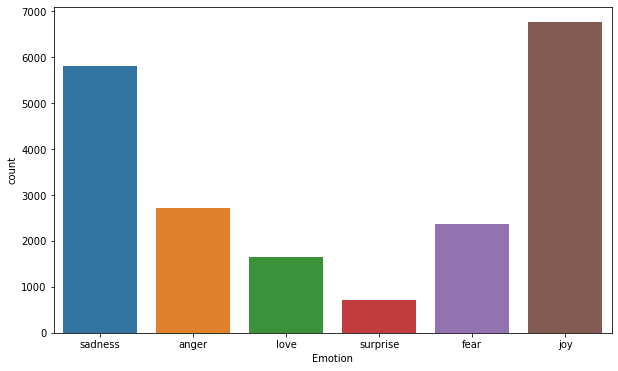

In [7]:
# No null values found in data
# There are no null values
plt.figure(figsize=(10,6))
sns.countplot(data["Emotion"])
plt.show()

In [8]:
#Label Encoding the sentiment column
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
data["Emotion"]= le.fit_transform(data["Emotion"])
data.head(5)

,Text,Emotion
0,i didnt feel humiliated,4
1,i can go from feeling so hopeless to so damned...,4
2,im grabbing a minute to post i feel greedy wrong,0
3,i am ever feeling nostalgic about the fireplac...,3
4,i am feeling grouchy,0


In [9]:
data["Emotion"].value_counts()

2    6761
4    5797
0    2709
1    2373
3    1641
5     719
Name: Emotion, dtype: int64

## Text Preprocessing:-

- Expanding Contractions
- Removing @mentions, hashtags and emojis 
- Removing Punctuations
- Removing digits
- Converting to lowercase
- Removing Stopwords

In [10]:
!pip install contractions

In [11]:
pip install tweet-preprocessor

Note: you may need to restart the kernel to use updated packages.


In [12]:
import contractions
import preprocessor as p
import string
import regex as re
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/ranjan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [13]:
STOPWORDS = set(stopwords.words('english'))

# Functions

In [14]:
def expand_contractions(text):
    text = contractions.fix(text)
    return text

def clean_tweet(text):
    text = p.clean(text)
    return text

punct_list=list(string.punctuation)
print(punct_list)
def remove_punctuation(text):
    
    for punc in punct_list:
        
        if punc in text:
            text = text.replace(punc,'')
    return text.strip()

def remove_digits(text):
    text = re.sub(r'\d+', '', text)
    return text

def to_lowercase(text):
    text = text.lower()
    return text

def remove_stopwords(text):
    text = ' '.join(word for word in text.split() if word not in STOPWORDS)
    return text








['!', '"', '#', '$', '%', '&', "'", '(', ')', '*', '+', ',', '-', '.', '/', ':', ';', '<', '=', '>', '?', '@', '[', '\\', ']', '^', '_', '`', '{', '|', '}', '~']


In [15]:
data["Text"] = data["Text"].apply(expand_contractions)

In [16]:
data.head(5)

,Text,Emotion
0,i did not feel humiliated,4
1,i can go from feeling so hopeless to so damned...,4
2,i am grabbing a minute to post i feel greedy w...,0
3,i am ever feeling nostalgic about the fireplac...,3
4,i am feeling grouchy,0


In [17]:
data["Text"] = data["Text"].apply(clean_tweet)
# Although the dataset appears to be free from hashtags,emojis, punctuations or numbers but this is a safe step to remove these if there are any


In [18]:
data["Text"] = data["Text"].apply(remove_punctuation)

In [19]:
data["Text"] = data["Text"].apply(remove_digits)

In [20]:
data["Text"] = data["Text"].apply(to_lowercase)

In [21]:
data["Text"] = data["Text"].apply(remove_stopwords)

In [22]:
data.head()

,Text,Emotion
0,feel humiliated,4
1,go feeling hopeless damned hopeful around some...,4
2,grabbing minute post feel greedy wrong,0
3,ever feeling nostalgic fireplace know still pr...,3
4,feeling grouchy,0


# Preprocessing is Complete
fit_on_texts Updates internal vocabulary based on a list of texts. 
This method creates the vocabulary index based on word frequency. 
So if you give it something like, "The cat sat on the mat." 
It will create a dictionary s.t. word_index["the"] = 1; word_index["cat"]
= 2 it is word -> index dictionary so every word gets a unique integer
value. 0 is reserved for padding. 
So lower integer means more frequent word (often the first few are stop words because they appear a lot).
texts_to_sequences Transforms each text in texts to a sequence of 
integers. So it basically takes each word in the text and replaces it 
with its corresponding integer value from the word_index dictionary. Nothing more, nothing less, certainly no magic involved.

In [23]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

In [24]:
# The maximum number of words to be used. (most frequent)
max_num_words = 50000
# Max number of words in each text statement.
max_seq_len = 250
embedding_dim = 100
tokenizer = Tokenizer(num_words=max_num_words, filters='!"#$%&()*+,-./:;<=>?@[\]^_`{|}~', lower=True)
tokenizer.fit_on_texts(data['Text'].values)
word_index = tokenizer.word_index
print('Found %s unique tokens.' % len(word_index))

Found 16868 unique tokens.


In [25]:
X = tokenizer.texts_to_sequences(data['Text'].values)
X = pad_sequences(X, maxlen=max_seq_len)
print('Shape of features:', X.shape)

Shape of features: (20000, 250)


In [26]:
X

array([[   0,    0,    0, ...,    0,    1,  496],
       [   0,    0,    0, ...,   48, 1536, 1227],
       [   0,    0,    0, ...,    1,  372,  299],
       ...,
       [   0,    0,    0, ..., 2765,  292,   85],
       [   0,    0,    0, ...,  404,  577, 2011],
       [   0,    0,    0, ..., 1173,   15,   13]], dtype=int32)

In [27]:
Y = pd.get_dummies(data['Emotion']).values
print('Shape of class labels', Y.shape)

Shape of class labels (20000, 6)


In [28]:
Y

array([[0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 1, 0],
       [1, 0, 0, 0, 0, 0],
       ...,
       [0, 0, 1, 0, 0, 0],
       [0, 0, 1, 0, 0, 0],
       [0, 0, 1, 0, 0, 0]], dtype=uint8)

In [29]:
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Embedding
from tensorflow.keras.layers import SpatialDropout1D
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dense 

In [30]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.20, random_state = 42)
print(X_train.shape,Y_train.shape)
print(X_test.shape,Y_test.shape)

(16000, 250) (16000, 6)
(4000, 250) (4000, 6)


In [31]:
X.shape[1]

250

In [32]:
lstm_model = Sequential()
lstm_model.add(Embedding(max_num_words, embedding_dim, input_length=X.shape[1]))
lstm_model.add(SpatialDropout1D(0.2))
lstm_model.add(LSTM(100, dropout=0.2, recurrent_dropout=0.2))
lstm_model.add(Dense(6, activation='softmax'))
lstm_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [33]:
epochs = 6
batch_size = 64

history = lstm_model.fit(X_train, Y_train, epochs=epochs, batch_size=batch_size,validation_split=0.1)


Epoch 1/6
225/225 [==============================] - 55s 240ms/step - loss: 1.2885 - accuracy: 0.5108 - val_loss: 0.7565 - val_accuracy: 0.7244
Epoch 2/6
225/225 [==============================] - 52s 230ms/step - loss: 0.3459 - accuracy: 0.8879 - val_loss: 0.3539 - val_accuracy: 0.8819
Epoch 3/6
225/225 [==============================] - 55s 243ms/step - loss: 0.1296 - accuracy: 0.9577 - val_loss: 0.3048 - val_accuracy: 0.8975
Epoch 4/6
225/225 [==============================] - 51s 227ms/step - loss: 0.0767 - accuracy: 0.9759 - val_loss: 0.2978 - val_accuracy: 0.8981
Epoch 5/6
225/225 [==============================] - 50s 223ms/step - loss: 0.0547 - accuracy: 0.9819 - val_loss: 0.3213 - val_accuracy: 0.8938
Epoch 6/6
225/225 [==============================] - 51s 228ms/step - loss: 0.0392 - accuracy: 0.9877 - val_loss: 0.3519 - val_accuracy: 0.8988


In [34]:
acc = lstm_model.evaluate(X_test,Y_test)
print('Test set\n  Loss: {:0.3f}\n  Accuracy: {:0.3f}'.format(acc[0],acc[1]))

125/125 [==============================] - 3s 24ms/step - loss: 0.3316 - accuracy: 0.9032
Test set
  Loss: 0.332
  Accuracy: 0.903


In [35]:
Y_pred = lstm_model.predict(X_test)



In [36]:
Y_pred

array([[9.9836522e-01, 2.2146467e-04, 2.8723753e-05, 2.4719920e-05,
        1.4007968e-04, 1.2197366e-03],
       [3.3849734e-04, 1.2106279e-04, 9.9875629e-01, 6.2097242e-04,
        1.5098037e-04, 1.2095483e-05],
       [5.2143949e-01, 2.1891019e-01, 4.7776178e-02, 2.3988433e-02,
        4.4496581e-02, 1.4338914e-01],
       ...,
       [9.9946696e-01, 1.9419828e-04, 1.3635113e-04, 3.3850984e-06,
        9.8932265e-05, 1.0036974e-04],
       [6.2173640e-05, 4.2160278e-05, 9.9972516e-01, 1.1563683e-04,
        4.2306809e-05, 1.2613861e-05],
       [3.9347146e-06, 4.4507697e-06, 9.9955457e-01, 4.3391553e-04,
        1.0929164e-06, 2.0090672e-06]], dtype=float32)

In [37]:
y_pred_bool = np.argmax(Y_pred, axis=1) #Converting to single entry and not a list of probabilities)

In [38]:
y_pred_bool

array([0, 2, 0, ..., 0, 2, 2])

In [39]:
# But out test labels are still one hot encoded. Converting them to single value as this is 
# required to calculate classification report
Y_test_new = np.argmax(Y_test, axis = 1)

In [40]:
Y_test_new

array([0, 2, 4, ..., 0, 2, 2])

In [41]:
print(classification_report(Y_test_new, y_pred_bool))

              precision    recall  f1-score   support

           0       0.93      0.89      0.91       536
           1       0.86      0.83      0.84       458
           2       0.92      0.94      0.93      1339
           3       0.82      0.81      0.82       335
           4       0.93      0.95      0.94      1173
           5       0.79      0.74      0.76       159

    accuracy                           0.90      4000
   macro avg       0.87      0.86      0.87      4000
weighted avg       0.90      0.90      0.90      4000



In [42]:
from sklearn.metrics import accuracy_score,f1_score

acc = accuracy_score(Y_test_new,y_pred_bool)
f1=f1_score(Y_test_new,y_pred_bool, average='weighted')
print ("Accuracy is:", acc)
print("F1 Score is:",f1)

Accuracy is: 0.90325
F1 Score is: 0.9026943330977899


## Applying SHAP on data

In [43]:
def new_predict(texts):
  _seq = tokenizer.texts_to_sequences(texts)
  _text_data = pad_sequences(_seq, maxlen=max_seq_len)
  return lstm_model.predict(_text_data)

In [44]:
class_names = le.classes_
class_names

array(['anger', 'fear', 'joy', 'love', 'sadness', 'surprise'],
      dtype=object)

In [45]:
masker = shap.maskers.Text(tokenizer=r"\W+")

In [46]:
explainer = shap.Explainer(new_predict, masker=masker, output_names=class_names)
explainer

## Experiment - Testing 5 examples

In [47]:
example_1 = "feel law states suggestions optimistic beneficial employees specially wish rapidly ramadan said"
example_2 = "however want know something someone causing feel less splendid self step away"
example_3 = "feel pretty pathetic time"
example_4 = "extra money worried time feel beyond pathetic"
example_5 = "really like shop part feel threatened want spend"

examples_new = [example_1, example_2, example_3,example_4, example_5]
examples_new

['feel law states suggestions optimistic beneficial employees specially wish rapidly ramadan said',
 'however want know something someone causing feel less splendid self step away',
 'feel pretty pathetic time',
 'extra money worried time feel beyond pathetic',
 'really like shop part feel threatened want spend']

In [48]:
shap_values = explainer(examples_new)

In [49]:
print("SHAP Values Shape : {}".format(shap_values.shape))
print("SHAP Base Values  : {}".format(shap_values.base_values))
print("SHAP Data : ")
print(shap_values.data[0])
print(shap_values.data[1])
print(shap_values.data[2])
print(shap_values.data[3])
print(shap_values.data[4])

SHAP Values Shape : (5, None, 6)
SHAP Base Values  : [[0.28443635 0.13811378 0.20755556 0.11788548 0.10092792 0.15108091]
 [0.28443635 0.13811378 0.20755556 0.11788548 0.10092792 0.15108091]
 [0.28443635 0.13811378 0.20755556 0.11788548 0.10092792 0.15108091]
 [0.28443635 0.13811378 0.20755556 0.11788548 0.10092792 0.15108091]
 [0.28443635 0.13811378 0.20755556 0.11788548 0.10092792 0.15108091]]
SHAP Data : 
['feel ' 'law ' 'states ' 'suggestions ' 'optimistic ' 'beneficial '
 'employees ' 'specially ' 'wish ' 'rapidly ' 'ramadan ' 'said']
['however ' 'want ' 'know ' 'something ' 'someone ' 'causing ' 'feel '
 'less ' 'splendid ' 'self ' 'step ' 'away']
['feel ' 'pretty ' 'pathetic ' 'time']
['extra ' 'money ' 'worried ' 'time ' 'feel ' 'beyond ' 'pathetic']
['really ' 'like ' 'shop ' 'part ' 'feel ' 'threatened ' 'want ' 'spend']


In [50]:
shap.text_plot(shap_values)

## Removing the most contributing features in the above examples and checking if SHAP shows a change in prediction

In [51]:
example_1 = "law states beneficial employees specially wish rapidly ramadan said"
example_2 = "however want know something someone causing feel less self"
example_3 = "feel pretty time"
example_4 = "extra money worried time feel beyond"
example_5 = "really like shop part feel want spend"


examples_updated = [example_1, example_2, example_3,example_4, example_5]
examples_updated

['law states beneficial employees specially wish rapidly ramadan said',
 'however want know something someone causing feel less self',
 'feel pretty time',
 'extra money worried time feel beyond',
 'really like shop part feel want spend']

In [52]:
shap_values = explainer(examples_updated)

In [53]:
shap.text_plot(shap_values)

In [54]:
# We can see that the predictions changed. Therefore, SHAP is doing the right job in making predictions.

## Checking other examples

In [60]:
example_1 = "i for one am feeling a bit anxious at how long we are staying but i know we need to do this"
#fear
example_2 = "i feel as though im doomed to finding a man"
#sadness
example_3 = "im feeling truly adventurous ill go for a faux hawk of some sort"
#joy
example_4 = "i feel so much love for him and he is so supportive"
#love
example_5 = "i ahem guess i havent been feeling compassionate"
#love

examples_test = [example_1, example_2, example_3,example_4, example_5]
examples_test



['i for one am feeling a bit anxious at how long we are staying but i know we need to do this',
 'i feel as though im doomed to finding a man',
 'im feeling truly adventurous ill go for a faux hawk of some sort',
 'i feel so much love for him and he is so supportive',
 'i ahem guess i havent been feeling compassionate']

In [61]:
shap_values = explainer(examples_test)
shap.text_plot(shap_values)


In [63]:
example_1 = "i for one am feeling a at how long we are but i know we need to do this"
#fear
example_2 = "i feel as though im to finding a"
#sadness
example_3 = "im truly ill go for a of some sort"
#joy
example_4 = "i feel so much or him and he is so"
#love
example_5 = "i guess i havent been feeling "
#love

examples_test2 = [example_1, example_2, example_3,example_4, example_5]
examples_test2

['i for one am feeling a at how long we are but i know we need to do this',
 'i feel as though im to finding a',
 'im truly ill go for a of some sort',
 'i feel so much or him and he is so',
 'i guess i havent been feeling ']

In [64]:
shap_values = explainer(examples_test2)
shap.text_plot(shap_values)